In [1]:
import matplotlib.pyplot as plt
import numpy as np
import sympy as sym
from scipy.integrate import solve_ivp
from scipy import integrate
import jax
import jax.numpy as jnp
import cvxpy as cp
from jax.typing import ArrayLike
from jax import jit
import random as rand
import plotly.graph_objects as go
import time 

In [3]:
    
#plotting 
def plotdyntheta(tmax, linUp, controls, states, dt,bound, qsun):
    t = jnp.linspace(0, tmax+1, int(tmax/dt)+1)
    
    #updates = jnp.linspace(0, (tmax+1)/10, int(tmax/Updt))
   
    #updates = [dt*x for x in linUp]

    fig = plt.figure(1,figsize=(12,12)) # create figure 2

    states = jnp.stack(states)

    controls = jnp.stack(controls)

    q1, q2, q3, q4, w1, w2, w3 = states.T
    u1, u2, u3 = controls.T

    xs = [-1, 1]
    plt.subplot(551)
    plt.plot(t, q1, label='q 1',linestyle='dashed')
    plt.plot(t, q2, label='q 2', linestyle='dashed')
    plt.plot(t, q3, label='q 3',linestyle='dashed')
    plt.plot(t, q4, label='q 4', linestyle='dashed')
    #plt.vlines(x = updates, ymin = -1, ymax = np.max(xs),
    #        colors = 'cyan',
    #       linestyles='dotted')
    plt.xlabel('Time (s)')
    plt.ylabel('quaternion parts')
    plt.title('Quaternion')
    plt.legend()

    plt.subplot(552)
    plt.plot(t, w1, label='Sat wx', linestyle='dashed')
    plt.plot(t, w2, label='Sat wy', linestyle='dashed')
    plt.plot(t, w3, label='Sat wz', linestyle='dotted')
    #plt.vlines(x = updates, ymin = -1, ymax = np.max(xs),
     #       colors = 'cyan',
     #       linestyles='dotted')
    plt.xlabel('Time (s)')
    plt.ylabel('speed (rads/s)')
    plt.title('Angular Velocity')
    plt.legend()

    plt.subplot(553)
    plt.plot(t, u1, label='Sat Tx', linestyle='dashed')
    plt.plot(t, u2, label='Sat Ty', linestyle='dashed')
    plt.plot(t, u3, label='Sat Tz', linestyle='dotted')
    
    plt.xlabel('Time (s)')
    plt.ylabel('Torque N-M')
    plt.title('Torque on satellite')
    plt.legend()

    qdiffneg = q1*qsun[0] - q2*qsun[1] - q3*qsun[2] - q4*qsun[3]
   
    sun = qsun
    qdiff = q1*sun[0] + q2*sun[1] + q3*sun[2] + q4*sun[3]

    
   
        # Extract the wheel torque contributions
    O1 = (np.sqrt(3)/4)*(u1 - u2 - u3)
    O2 = (np.sqrt(3)/4)*(u1 + u2 - u3)
    O3 = (np.sqrt(3)/4)*(-u1 - u2 - u3)
    O4 = (np.sqrt(3)/4)*(-u1 + u2 - u3)

    
    O1 = integrate.cumtrapz(68000*9.55*O1, t, initial=0)
    O2 = integrate.cumtrapz(68000*9.55*O2, t, initial=0)
    O3 = integrate.cumtrapz(68000*9.55*O3, t, initial=0)
    O4 = integrate.cumtrapz(68000*9.55*O4, t, initial=0)


    plt.subplot(554)
    
    plt.plot(t,  O1, label='wheel1', linestyle='dashed')
    plt.plot(t,  O2, label='wheel2', linestyle='dashed')
    plt.plot(t,  O3, label='wheel3', linestyle='dashed')
    plt.plot(t,  O4, label='wheel4', linestyle='dashed')
    plt.xlabel('Time (s)')
    plt.ylabel('rpm')
    plt.title('Reaction wheel speed')
    plt.legend()

    plt.subplot(555)
    plt.plot(t,  360*np.arccos(qdiff)/np.pi, label='Sat Tx', linestyle='dashed')
    #plt.plot(t,  360*np.arccos(qdiffneg)/np.pi, label='Sat Tx', linestyle='dashed')
    plt.axhline(y = 360* np.arccos(bound)/np.pi, color = 'r', linestyle = '-') 
    plt.axhline(y = 360* np.arccos(-bound)/np.pi, color = 'r', linestyle = '-') 
    #plt.vlines(x = updates, ymin = -1, ymax = np.max(xs),
     #       colors = 'cyan',
      #      linestyles='dotted')
    plt.xlabel('Time (s)')
    plt.ylabel('quat')
    plt.title('bound check')

    plt.show()
    fig.tight_layout()
        

In [4]:
# Housekeeping and intial state generation
def skewMatrix(w):
    skew = jnp.array([
        [0, -w[0], -w[1], -w[2]],
        [w[0], 0, w[2], -w[1]],
        [w[1], -w[2], 0, w[0]],
        [w[2], w[1], -w[0], 0]])
    return skew

def quatgen():
    q1_inf = rand.uniform(-1,1)
    q2_inf = rand.uniform(-1,1)
    q3_inf = rand.uniform(-1,1)
    q4_inf = rand.uniform(-1,1)

    q_inf = jnp.array([q1_inf, q2_inf, q3_inf, q4_inf])
    q_norm_scale = jnp.linalg.norm(q_inf) 

    q_norm = q_inf /q_norm_scale
    return q_norm

def w0gen():


    w1 = rand.uniform(-.5,.5)
    w2 = rand.uniform(-.5,.5)
    w3 = rand.uniform(-.5,.5)
    return jnp.array([w1, w2, w3])

def state0gen():
    q = quatgen()
    w = w0gen()
    state0 = jnp.concatenate((q, w))
    return state0

def state0gen2():
    q = quatgen()
    w = jnp.array([0,0,0])
    state0 = jnp.concatenate((q, w))
    return state0

In [5]:
# Quaternion manipulation functions
def quaternion_conjugate(q):
    """Return the conjugate of a quaternion."""
    w, x, y, z = q
    return jnp.array([w, -x, -y, -z])

def quaternion_multiply(q1, q2):
    """Multiply two quaternions."""
    w1, x1, y1, z1 = q1
    w2, x2, y2, z2 = q2
    w = w1*w2 - x1*x2 - y1*y2 - z1*z2
    x = w1*x2 + x1*w2 + y1*z2 - z1*y2
    y = w1*y2 - x1*z2 + y1*w2 + z1*x2
    z = w1*z2 + x1*y2 - y1*x2 + z1*w2
    return jnp.array([w, x, y, z])

def quaternion_difference(q1, q2):

    """Compute the quaternion difference q2 * inv(q1)."""
    q1_inv = quaternion_conjugate(q1)  # Use conjugate for unit quaternion
    return quaternion_multiply(q2, q1_inv)

def quaternion_to_rotation_matrix(q):
    w, x, y, z = q
    return np.array([
        [1 - 2*y**2 - 2*z**2, 2*x*y - 2*z*w, 2*x*z + 2*y*w],
        [2*x*y + 2*z*w, 1 - 2*x**2 - 2*z**2, 2*y*z - 2*x*w],
        [2*x*z - 2*y*w, 2*y*z + 2*x*w, 1 - 2*x**2 - 2*y**2]
    ])

def angle(q1):
    return 2*np.arccos(q1)*180/np.pi

def Normq(new_state):
    q = new_state[0:4]
    qnorm = jnp.linalg.norm(q)
    q_normed = q/qnorm
    return q_normed
    

In [6]:
# Dynamics of system
def attitudeDyn(state, control):

    q = state[0:4]
    w = state[4:7]
    
    skew = skewMatrix(w)
   
    #J  = jnp.array([[1, 0, 0],
    #               [0, 1, 0],
    #               [0, 0, 1]])

    J  = jnp.array([[0.0067, 0, 0],
                    [0, 0.033, 0],
                    [0, 0, 0.033]])
    
    # Compute the angular acceleration
    wdot = jnp.linalg.inv(J) @ (control- jnp.cross(w, J@w))
    
    # Compute the derivative of the quaternion
    qdot = 0.5* (skew @ q )

    state_dot = jnp.concatenate((qdot, wdot))

    return state_dot


In [7]:
# linearization of dynamics
def linearize_autodiff3( state, control):

    func_x = jit(jax.jacfwd(attitudeDyn, argnums=0))
    func_u = jit(jax.jacfwd(attitudeDyn, argnums=1))

    A = func_x(state, control)
    B = func_u(state, control)

    return A, B


In [8]:
def q_flower(q0, numPetals):
    e = np.array([1,0,0])
    q_flowers = [q0]
    theta = 360/numPetals
    coe = (np.sin((theta*np.pi/180)/2))
    qdiff123 = e * coe
    qdiff = jnp.array([(1- (qdiff123[0]**2+qdiff123[1]**2+qdiff123[2]**2))**.5,qdiff123[0],qdiff123[1],qdiff123[2]])
    #print("max error (deg) = ", 180/numPetals)
    for i in range(numPetals):
        qf = quaternion_multiply(q0, qdiff)
        q_flowers.append(qf)
        q0 = qf

    return q_flowers

def q_flowerstack(q0, numPetals):
    e = np.array([1,0,0])
    q_flower1 = q0
    theta = 360/numPetals
    coe = (np.sin((theta*np.pi/180)/2))
    qdiff123 = e * coe
    qdiff = jnp.array([(1- (qdiff123[0]**2+qdiff123[1]**2+qdiff123[2]**2))**.5,qdiff123[0],qdiff123[1],qdiff123[2]])
    #print("max error (deg) = ", 180/numPetals)
    for i in range(numPetals):
        qf = quaternion_multiply(q0, qdiff)
        q_flower1 = jnp.vstack((q_flower1, qf))
        q0 = qf

    return q_flower1

In [9]:
def findMinPath(Goal_state, State_0, numPetals):
    goal_diff = []
    goal_flower = q_flower(Goal_state[0:4],numPetals)
    for goal in goal_flower:
        qdiff = quaternion_difference(goal, State_0[0:4])[0]
        goal_diff.append(qdiff)
    max0 = np.max(goal_diff)
    i = np.argmax(goal_diff)
    ideal_goal = goal_flower[i]
    idealdiff = quaternion_difference(ideal_goal, State_0[0:4])
    IdealAng = angle(idealdiff[0])
    print("Min Angle :", IdealAng)
    return ideal_goal

def findMinPath2(Goal_state, State_0, numPetals):
    goal_diff = []
    goal_flower = q_flower(Goal_state[0:4],numPetals)
    for goal in goal_flower:
        qdiff = quaternion_difference(goal, State_0[0:4])[0]
        goal_diff.append(qdiff)
    max0 = np.max(goal_diff)
    i = np.argmax(goal_diff)
    ideal_goal = goal_flower[i]
    idealdiff = quaternion_difference(ideal_goal, State_0[0:4])
    IdealAng = angle(idealdiff[0])
    print("Min Angle :", IdealAng)
    return ideal_goal, IdealAng

def findMinTrag(Goal_state, State_0, numPetals):
   
   
    goalquat, goalAng= findMinPath2(Goal_state, State_0, numPetals)
    startquat, startAng= findMinPath2( State_0, Goal_state, numPetals)

    if (goalAng < startAng):
        idealgoal = jnp.concatenate((goalquat,jnp.array([0,0,0])))
        idealstart = State_0
    else: 
        idealgoal = Goal_state
        idealstart = jnp.concatenate((startquat,jnp.array([0,0,0])))

    return idealgoal, idealstart

    

In [10]:

def TrajectoryPlanner(state0, control0, goalstate, numIt, bound, numskip, dt, qsun, max_torque, KP , KD, bounds):
    statestraj = [state0]
    linUp =[]
    controls = [control0]
      
    MPCHorizon=25

 
    us= cp.Variable((3,MPCHorizon-1))
    states = cp.Variable((7,MPCHorizon))
    udes= cp.Variable((3,MPCHorizon-1))
    gamma1= cp.Variable((1,MPCHorizon-1))
    gamma2 =cp.Variable((1,MPCHorizon-1))
    error = cp.Variable((4, MPCHorizon-1))
    As = cp.Parameter((7,7))
    Bs = cp.Parameter((7,3))
    state = cp.Parameter((7))
    k_p = cp.Parameter((3,3)) 

    
    g1, g2, g3, g4 = goalstate[0:4]
    
    #g2 =-g2
    #g3 =-g3
    #g4 =-g4

    goalcon = jnp.array([[g1,  g2,  g3, g4],
              [g2 ,  -g1,   -g4, g3],
              [g3,  g4,   -g1, -g2],
             [g4,  -g3,  g2,  -g1]])
    
    
    constraints = []

  
    kd = jnp.diag(jnp.array([KD, KD, KD]))
    kp = jnp.diag(jnp.array([KP, KP,KP]))

    
    constraints.append(states[:,0] == state)
    #constraints.append(k_p == kp)
    bound = np.full((len(qsun)), bound)
    max_torque = np.full((3), max_torque)
    
    for i in range(MPCHorizon-1):

       # constraints.append(error[:,i] == goalcon @ states[0:4,i])
        constraints.append(error[:,i] == goalcon @ states[0:4,i])  
        constraints.append(cp.norm(us[:,i]) <= max_torque)
        
        constraints.append(states[:,i+1] ==(As @ states[:,i] + Bs @ us[:,i])*dt + states[:,i])
        constraints.append(udes[:,i] == kp@error[1:4,i]- kd@states[4:7, i])
        
            
        if (bounds):
            constraints.append( states[0,i]*qsun[:,0] +states[1,i]*qsun[:,1]+states[2,i]*qsun[:,2]+states[3,i]*qsun[:,3] - gamma1[:,i] <= bound)
            constraints.append( -(states[0,i]*qsun[:,0] +states[1,i]*qsun[:,1]+states[2,i]*qsun[:,2]+states[3,i]*qsun[:,3]) - gamma2[:,i] <= bound)
    
  
    objective = 1e-3*cp.Minimize(cp.sum_squares(us - udes) + 1e7*cp.sum_squares(gamma2)+ 1e7*cp.sum_squares(gamma1))   
  
 
    prob = cp.Problem(objective, constraints)
    
    for i in range(int(numIt)): 
        new_state = statestraj[i]
        new_control = controls[i]

        

        # Norming 
        q = new_state[0:4]
        qnorm = jnp.linalg.norm(q)
        q_normed = q/qnorm       
        new_state = jnp.array([q_normed[0],q_normed[1],q_normed[2],q_normed[3], new_state[4], new_state[5], new_state[6]])
        
        state.project_and_assign(new_state)

        if (i % numskip == 0):
            
            
            A, B= linearize_autodiff3(new_state, new_control) 
            As.project_and_assign(A)
            Bs.project_and_assign(B)
            linUp.append(i)
           
            print(i)
        errors = goalcon @ new_state[0:4]
        kp = jnp.diag(jnp.array([KP, KP,KP]))
        print(errors)
       
        
        print(jnp.linalg.norm(errors))
        
          
        result  = prob.solve(solver=cp.ECOS)#, verbose = True)  


        x_value = states.value[:,1]#jnp.array([states[:,i].value for i in range(T-1)])
        u_value = us.value[:,1]
        #print("cvx error ", error.value[:,:])   
           
        statestraj.append(x_value)
        controls.append(u_value)

    print(result)
    #print(errors)
    print("done!")
    return statestraj, controls, linUp


In [11]:

def plot3D(states1, states2, goalstate, sun1, sun2, d, d2, state0):


    zeros = np.array([0, 0, 0])
    x_axis = np.array([1, 0, 0])

    points1 = np.array([np.dot(quaternion_to_rotation_matrix(q[0:4]), x_axis) for q in states1])
    points2 = np.array([np.dot(quaternion_to_rotation_matrix(q[0:4]), x_axis) for q in states2])
    pointssun = np.array([np.dot(quaternion_to_rotation_matrix(sun1), x_axis)])[0]
    pointssun2 = np.array([np.dot(quaternion_to_rotation_matrix(sun2), x_axis)])[0]

    sun = np.array((pointssun, zeros))

    sun_vector = pointssun

    # Create a sphere
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones(np.size(u)), np.cos(v))

    # Choose a starting point on the sphere, e.g., the "north pole"
    start_point1 = sun_vector
    start_point2 = pointssun2

    quat1 = state0[0:4]
    quat2 = np.array([1,0,0,0])

    

  
    quat3 = goalstate[0:4]
    quat4 = np.array([.892,.239,.370,0.099])
    
    
    quat4 = sun2
    point4 = np.array([np.dot(quaternion_to_rotation_matrix(quat3), x_axis)])
    vec3 = np.array((point4[0], zeros))

    point3 = np.array([np.dot(quaternion_to_rotation_matrix(quat4), x_axis)])
    vec4 = np.array((point3[0], zeros))

    
    point5 = np.array([np.dot(quaternion_to_rotation_matrix(quat1), x_axis)])
    point6 = np.array([np.dot(quaternion_to_rotation_matrix(quat2), x_axis)])

    vec1 = np.array((point5[0], zeros))
    vec2 = np.array((point6[0], zeros))

    

    # Calculate distances from the start point
    distances1 = np.sqrt((x - start_point1[0])**2 + (y - start_point1[1])**2 + (z - start_point1[2])**2)


    distances1 = np.where(distances1>d, distances1, 5)
    # Normalize distances for color mapping
    normalized_distances1 = (distances1 - distances1.min()) / (distances1.max() - distances1.min())

    distances2 = np.sqrt((x - start_point2[0])**2 + (y - start_point2[1])**2 + (z - start_point2[2])**2)

    distances2 = np.where(distances2>d2, distances2, 5)
    # Normalize distances for color mapping
    normalized_distances2 = (distances2 - distances2.min()) / (distances2.max() - distances2.min())

    normalized_distances1 = normalized_distances1 + normalized_distances2
    camera = dict(
                up=dict(x=0, y=1, z=0),
                center=dict(x=0, y=0, z=0),
                eye=dict(x=1.25, y=1.25, z=1.25))
    # Plot using Plotly
    fig = go.Figure(data=[
        go.Surface(x=x, y=y, z=z,surfacecolor=normalized_distances1**2,  # This colors the surface
        colorscale='viridis',  # You can choose any color scale
        cmin=0, cmax=5,  opacity=.4),
        
        go.Scatter3d(x=points1[:, 0], y=points1[:, 1], z=points1[:, 2], mode='markers', marker=dict(size=5, color= points2[:, 2], colorscale='tropic', cmin=-1, cmax=1), name='constrained'),
        go.Scatter3d(x=points1[:, 0], y=points1[:, 1], z=points1[:, 2], mode='lines', line=dict(colorscale='twilight', width=2, cmin=-1, cmax=1)),
        go.Scatter3d(x=points2[:, 0], y=points2[:, 1], z=points2[:, 2], mode='markers', marker=dict(size=5, color= points2[:, 2] ,colorscale='sunset', cmin=-1, cmax=1), name='unconstrained'),
        go.Scatter3d(x=points2[:, 0], y=points2[:, 1], z=points2[:, 2], mode='lines', line=dict(colorscale='tealrose', width=2, cmin=-1, cmax=1)),
        go.Scatter3d(x=sun[:, 0], y=sun[:, 1], z=sun[:, 2], mode='lines', line=dict(color='yellow', width=5)),
        go.Scatter3d(x=vec1[:, 0], y=vec1[:, 1], z=vec1[:, 2], mode='lines', line=dict(color='red', width=5)),
        go.Scatter3d(x=vec2[:, 0], y=vec2[:, 1], z=vec2[:, 2], mode='lines', line=dict(color='green', width=5)),
        go.Scatter3d(x=vec3[:, 0], y=vec3[:, 1], z=vec3[:, 2], mode='lines', line=dict(color='blue', width=5)),
        go.Scatter3d(x=vec4[:, 0], y=vec4[:, 1], z=vec4[:, 2], mode='lines', line=dict(color='orange', width=5))

    ])

    fig.update_layout(title='Quaternion Rotations Visualized on Unit Sphere', autosize=True,
                    
                    scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis',
                                xaxis=dict(range=[-1.1, 1.1], autorange=False),
                                yaxis=dict(range=[-1.1, 1.1], autorange=False),
                                zaxis=dict(range=[-1.1, 1.1], autorange=False)),
                                scene_camera=camera, 
                    scene_aspectmode='cube')

    fig.show()


In [12]:

def plot3Dnew(states1, states2, goalstate, suns, d):


    zeros = np.array([0, 0, 0])
    x_axis = np.array([1, 0, 0])

    Traj = []
    for state in states1:
        Traj.append(np.array([np.dot(quaternion_to_rotation_matrix(q[0:4]), x_axis) for q in states1]))

    Traj = np.vstack(Traj)

    Unconstrained = np.array([np.dot(quaternion_to_rotation_matrix(q[0:4]), x_axis) for q in states2])

    Sunspoints = []
    sunvec = []
    for Sun in suns:
        Sunspoints.append(np.array([np.dot(quaternion_to_rotation_matrix(Sun), x_axis)])[0])
        sunvec.append(np.array((Sun, zeros)))


    # Create a sphere
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones(np.size(u)), np.cos(v))
    

    
    



    point4 = np.array([np.dot(quaternion_to_rotation_matrix(quat3), x_axis)])
    vec3 = np.array((point4[0], zeros))

    point3 = np.array([np.dot(quaternion_to_rotation_matrix(quat4), x_axis)])
    vec4 = np.array((point3[0], zeros))

    
    point5 = np.array([np.dot(quaternion_to_rotation_matrix(quat1), x_axis)])
    point6 = np.array([np.dot(quaternion_to_rotation_matrix(quat2), x_axis)])

    vec1 = np.array((point5[0], zeros))
    vec2 = np.array((point6[0], zeros))

    
    distances = []
    for Sun in Sunspoints:
        # Calculate distances from the start point
        distances1 = np.sqrt((x - start_point1[0])**2 + (y - start_point1[1])**2 + (z - start_point1[2])**2)
        distances1 = np.where(distances1>d, distances1, 5)
        # Normalize distances for color mapping
        normalized_distances1 = (distances1 - distances1.min()) / (distances1.max() - distances1.min())
    print()  

    distances2 = np.sqrt((x - start_point2[0])**2 + (y - start_point2[1])**2 + (z - start_point2[2])**2)
    distances2 = np.where(distances2>d, distances2, 5)
    # Normalize distances for color mapping
    normalized_distances2 = (distances2 - distances2.min()) / (distances2.max() - distances2.min())


    normalized_distances1 = normalized_distances1 + normalized_distances2



    camera = dict(
                up=dict(x=0, y=1, z=0),
                center=dict(x=0, y=0, z=0),
                eye=dict(x=1.25, y=1.25, z=1.25))
    # Plot using Plotly
    fig = go.Figure(data=[
        go.Surface(x=x, y=y, z=z,surfacecolor=normalized_distances1**2,  # This colors the surface
        colorscale='viridis',  # You can choose any color scale
        cmin=0, cmax=5,  opacity=.4),
        #constrained Trajectory
        go.Scatter3d(x=Traj[:,:, 0], y=Traj[:,:, 1], z=Traj[:,:, 2], mode='markers', marker=dict(size=5, color= Traj[:,:, 2], colorscale='tropic', cmin=-1, cmax=1), name='constrained'),
        go.Scatter3d(x=Traj[:,:, 0], y=Traj[:,:, 1], z=Traj[:,:, 2], mode='lines', line=dict(colorscale='twilight', width=2, cmin=-1, cmax=1)),
        # Unconstrained Trajectory
        go.Scatter3d(x=Unconstrained[:, 0], y=Unconstrained[:, 1], z=Unconstrained[:, 2], mode='markers', marker=dict(size=5, color= Unconstrained[:, 2] ,colorscale='sunset', cmin=-1, cmax=1), name='unconstrained'),
        go.Scatter3d(x=Unconstrained[:, 0], y=Unconstrained[:, 1], z=Unconstrained[:, 2], mode='lines', line=dict(colorscale='tealrose', width=2, cmin=-1, cmax=1)),

        go.Scatter3d(x=sun[:, 0], y=sun[:, 1], z=sun[:, 2], mode='lines', line=dict(color='yellow', width=5)),
        go.Scatter3d(x=vec1[:, 0], y=vec1[:, 1], z=vec1[:, 2], mode='lines', line=dict(color='red', width=5)),
        go.Scatter3d(x=vec2[:, 0], y=vec2[:, 1], z=vec2[:, 2], mode='lines', line=dict(color='green', width=5)),
        go.Scatter3d(x=vec3[:, 0], y=vec3[:, 1], z=vec3[:, 2], mode='lines', line=dict(color='blue', width=5)),
        go.Scatter3d(x=vec4[:, 0], y=vec4[:, 1], z=vec4[:, 2], mode='lines', line=dict(color='orange', width=5))

    ])

    fig.update_layout(title='Quaternion Rotations Visualized on Unit Sphere', autosize=True,
                    
                    scene=dict(xaxis_title='X Axis', yaxis_title='Y Axis', zaxis_title='Z Axis',
                                xaxis=dict(range=[-1.1, 1.1], autorange=False),
                                yaxis=dict(range=[-1.1, 1.1], autorange=False),
                                zaxis=dict(range=[-1.1, 1.1], autorange=False)),
                                scene_camera=camera, 
                    scene_aspectmode='cube')

    fig.show()


In [13]:

def runsimNew(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque, kp, kd):
    Numsteps = Time_run/dt
    
    control0 = jnp.array([ 0, 0 ,0], dtype=jnp.float32)

    sun_flower  = q_flowerstack(Sun1, 10)
    sun_flower2 = q_flowerstack(Sun2, 10)

    error = quaternion_difference(Goal_state[0:4], State_0[0:4])
    print("error 0: ", error[0])
    if (error[0]<=0):
            kp = -kp
    else:
            kp = kp

    sun_flower = jnp.vstack((sun_flower, sun_flower2))
   
    states1, controls1,  linUp1 = TrajectoryPlanner(State_0, control0, Goal_state, Numsteps, Bound, dt_perLinearize, dt, sun_flower,max_torque, kp, kd, bounds=True)
    states2, controls2,  linUP2 = TrajectoryPlanner(State_0, control0, Goal_state, Numsteps, Bound, dt_perLinearize, dt, sun_flower, max_torque,kp , kd, bounds=False)

    return states1, states2, controls1, controls2, linUp1, linUP2

def runsimOnlyun(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque):
    Numsteps = Time_run/dt
    
    control0 = jnp.array([ 0, 0 ,0], dtype=jnp.float32)

    sun_flower  = q_flower(Sun1, 10)
    #sun_flower2 = q_flower(Sun2, 10)

    #for sun in sun_flower2:
    #    sun_flower.append(sun)
        
   

    #states1, controls1, normhis1, linUp1 = linearizedAttControlflowererror(State_0, control0, Goal_state, Numsteps, Bound, dt_perLinearize, dt, sun_flower,max_torque, bounds=True)
    states2, controls2, normhis2 , linUP2 = linearizedAttControlflowererror(State_0, control0, Goal_state, Numsteps, Bound, dt_perLinearize, dt, sun_flower, max_torque, bounds=False)

    return  states2,  controls2,  linUP2

def plotting(Time_run, linUp1, linUP2, controls1, controls2, states1, states2, dt,Bound, Sun1,Sun2, Goal_state, d, d2, State_0):
    plotdyntheta(Time_run, linUP2, controls2, states2, dt, Bound, Sun1)
    plotdyntheta(Time_run, linUP2, controls2, states2, dt, Bound, Sun2)

    plotdyntheta(Time_run, linUp1, controls1, states1, dt, Bound, Sun1)
    plotdyntheta(Time_run, linUp1, controls1, states1, dt, Bound, Sun2)

    plot3D(states1, states2, Goal_state, Sun1, Sun2, d, d2, State_0)
    

def plottingOnlyun(Time_run, linUp1, linUP2, controls1, controls2, states1, states2, dt,Bound, Sun1,Sun2, Goal_state, d, d2, State_0):
    plotdyntheta(Time_run, linUP2, controls2, states2, dt, Bound, Sun1)
    plotdyntheta(Time_run, linUP2, controls2, states2, dt, Bound, Sun2)

    states1 = states2
    plot3D(states1, states2, Goal_state, Sun1, Sun2, d, d2, State_0)


In [14]:
# 2 suns, off zero goal state
State_0 = jnp.array([0, 0, 1, 0, 0, 0 ,0], dtype=jnp.float32)

normed = Normq(State_0[0:4])

State_0 = jnp.array([normed[0], normed[1], normed[2], normed[3], 0, 0 ,.1], dtype=jnp.float32)


old_Goal_state = jnp.array([0.854, -.354, .354, -0.146, 0, 0 ,0])
Goal_state = old_Goal_state
Goal_state = findMinPath(old_Goal_state, State_0, 16)

print(old_Goal_state)
print(Goal_state)
#Goal_state = jnp.array([ 0.6998534,  -0.6040165 ,  0.38193005 ,-0.02758802])
Bound = .96

Time_run = 25
dt = 0.1
dt_perLinearize = 10
max_torque = .006
d = 2*np.arccos(Bound)
d2 =2*np.arccos(Bound)
kp = 2
kd = 5

Sun1 = jnp.array([.381, -0.033, .920, -0.081], dtype=jnp.float32)
Sun2 = jnp.array([.871, 0.308, .361, 0.128], dtype=jnp.float32)
#
states1, states2, controls1, controls2, linUp1, linUP2 = runsimNew(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque, kp, kd)
#states2, controls2, linUP2 = runsimOnlyun(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque)


Min Angle : 138.5356614258581
[ 0.854 -0.354  0.354 -0.146  0.     0.     0.   ]
[ 0.854 -0.354  0.354 -0.146]
error 0:  0.354
0
[ 0.354  0.146 -0.854 -0.354]
1.0006318
[ 0.3504425   0.13745314 -0.85541725 -0.35752213]
1.0006318
[ 0.34761977  0.12924305 -0.85642534 -0.3609104 ]
1.0006317
[ 0.34551474  0.12142782 -0.8569981  -0.36427063]
1.0006317
[ 0.3441162   0.11404799 -0.8571219  -0.36767265]
1.0006318
[ 0.34341794  0.10712963 -0.8567939  -0.37115458]
1.0006318
[ 0.3434171   0.10068878 -0.85601777 -0.37473226]
1.0006319
[ 0.34411302  0.09473404 -0.85480183 -0.3784038 ]
1.0006317
[ 0.3455059   0.08926959 -0.85315776 -0.38215494]
1.0006318
[ 0.34759572  0.0842977  -0.851097   -0.38596505]
1.0006318
10
[ 0.35038134  0.07982036 -0.84863156 -0.38980797]
1.0006318
[ 0.3616242   0.07989264 -0.8423118  -0.3932174 ]
1.0006318
[ 0.37251523  0.08102558 -0.8357466  -0.39681086]
1.0006318
[ 0.38306937  0.08295987 -0.82925195 -0.3999759 ]
1.0006318
[ 0.39312935  0.08558479 -0.8229386  -0.40269163

C:\Users\fatho\AppData\Local\Temp\ipykernel_30672\2143205463.py:86: RuntimeWarning: invalid value encountered in arccos
  plt.plot(t,  360*np.arccos(qdiff)/np.pi, label='Sat Tx', linestyle='dashed')


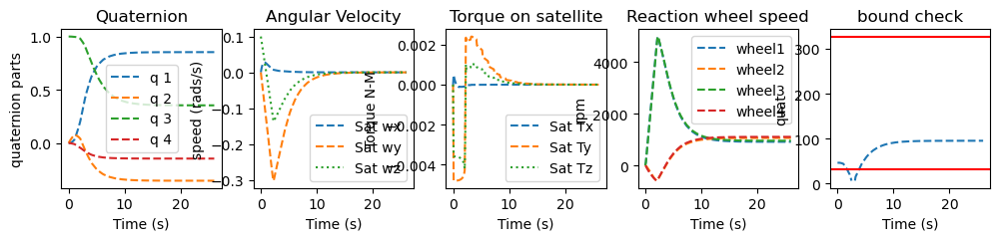

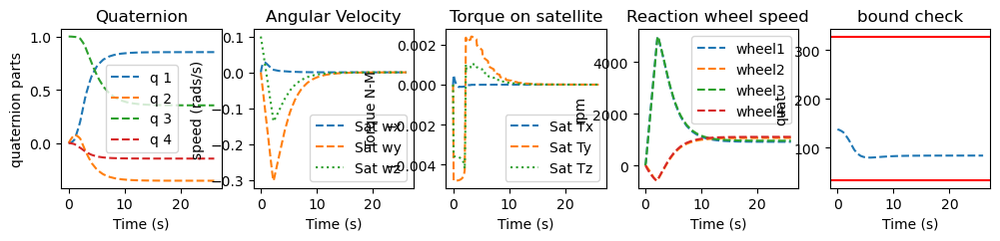

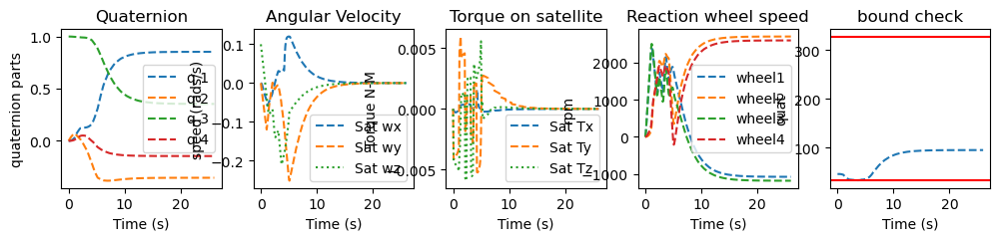

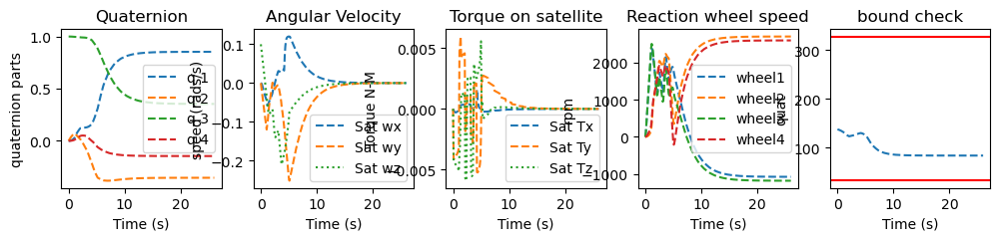

In [15]:

plotting(Time_run, linUp1, linUP2, controls1, controls2, states1, states2, dt,Bound, Sun1,Sun2, Goal_state, d, d2, State_0)


In [16]:
# 2 suns, off zero goal state
State_0 = jnp.array([.406, .579, .406, 0.579, 0, 0 ,0], dtype=jnp.float32)

old_Goal_state = jnp.array([0.854, -.354, .354, -0.146, 0, 0 ,0])
Goal_state = findMinPath(old_Goal_state, State_0, 64)
Bound = .94

Time_run = 25
dt = 0.1
dt_perLinearize = 10
max_torque = .0059
kp = 1.2
kd = 3.5
d = 2*np.arccos(Bound)
d2 =2*np.arccos(Bound)

Sun1 = jnp.array([.381, -0.033, .920, -0.081], dtype=jnp.float32)
Sun2 = jnp.array([.871, 0.308, .361, 0.128], dtype=jnp.float32)
states1, states2, controls1, controls2, linUp1, linUP2  =runsimNew(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque, kp, kd)


Min Angle : 129.7595786820654
error 0:  0.42451885
0
[ 0.42448613  0.00094248 -0.8347319  -0.35255772]
1.0006316
[ 0.42448613  0.00094248 -0.8347319  -0.35255772]
1.0006316
[ 0.42529604  0.00094032 -0.8343835  -0.35240647]
1.0006317
[ 0.42691466  0.00093661 -0.8336841  -0.3521043 ]
1.0006316
[ 0.4293401   0.00093184 -0.83262944 -0.35165057]
1.0006317
[ 0.43256918  0.00092628 -0.8312132  -0.3510433 ]
1.0006317
[ 0.43659756  0.00092019 -0.82942724 -0.35027978]
1.0006317
[ 0.44141933  0.00088264 -0.82726467 -0.3493497 ]
1.0006317
[ 4.4702631e-01  7.7697629e-04 -8.2471561e-01 -3.4824508e-01]
1.0006316
[ 4.5340770e-01  5.6679739e-04 -8.2176638e-01 -3.4696516e-01]
1.0006317
10
[ 4.6054876e-01  2.1281668e-04 -8.1839854e-01 -3.4551710e-01]
1.0006315
[ 0.4762906  -0.00087263 -0.81069624 -0.3423181 ]
1.0006316
[ 0.49175534 -0.00275677 -0.8026467  -0.33939806]
1.0006316
[ 0.5068515  -0.00540869 -0.7942979  -0.33678898]
1.0006316
[ 0.52148753 -0.00879005 -0.7857101  -0.33450976]
1.0006316
[ 0.5355

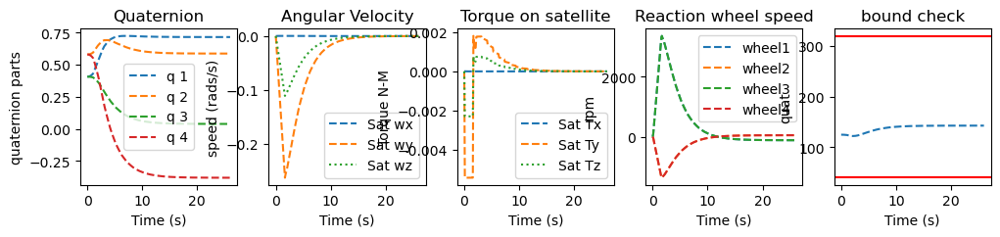

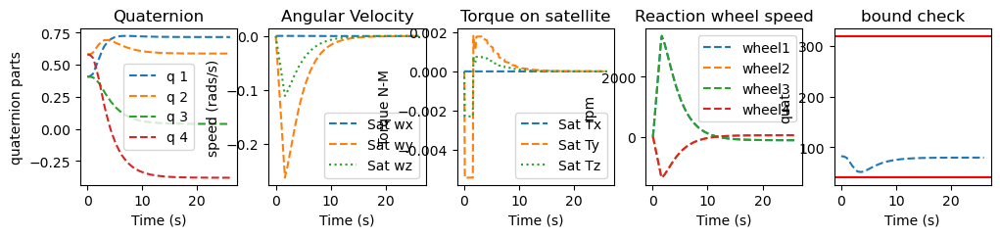

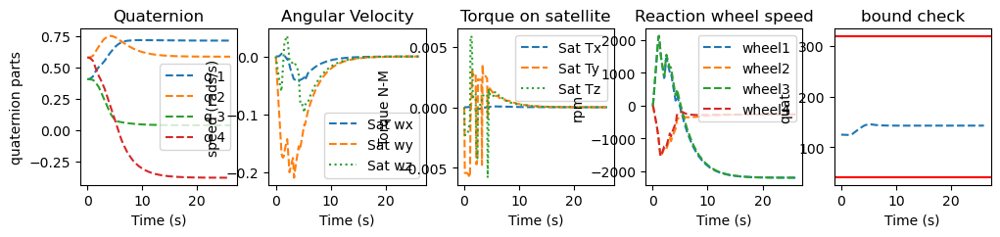

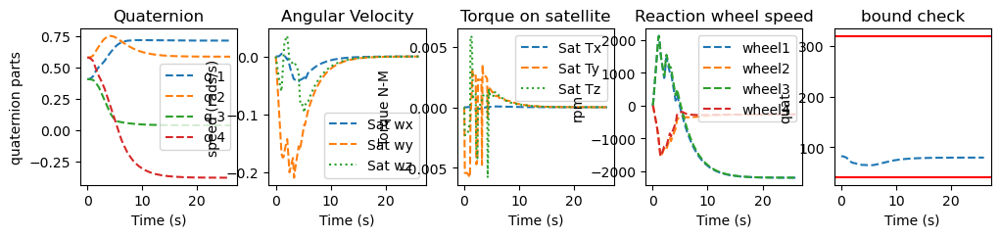

In [17]:
plotting(Time_run, linUp1, linUP2, controls1, controls2, states1, states2, dt,Bound, Sun1,Sun2, Goal_state, d, d2, State_0)

In [18]:
# 2 suns, off zero goal state
State_0 = jnp.array([0, 0, 1, 0, 0, 0 ,0], dtype=jnp.float32)

Goal_state = jnp.array([0.707, 0, .707, 0, 0, 0 ,0])
Goal_state = findMinPath(old_Goal_state, State_0, 12)
Bound = .96

Time_run = 25
dt = 0.1
dt_perLinearize = 10
max_torque = .0059
kp = 2
kd = 5
d = 2*np.arccos(Bound)
d2 =2*np.arccos(Bound)

Sun1 = jnp.array([.381, -0.033, .920, -0.081], dtype=jnp.float32)
Sun2 = jnp.array([.871, 0.308, .361, 0.128], dtype=jnp.float32)
states1, states2, controls1, controls2, linUp1, linUP2=runsimNew(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque, kp, kd)


Min Angle : 138.5356614258581
error 0:  0.354
0
[ 0.354  0.146 -0.854 -0.354]
1.0006318
[ 0.354  0.146 -0.854 -0.354]
1.0006318
[ 0.35474017  0.14636843 -0.8536009  -0.3540692 ]
1.0006317
[ 0.35621756  0.14711168 -0.8528126  -0.35417756]
1.0006317
[ 0.35842776  0.14823599 -0.8516442  -0.3542908 ]
1.0006319
[ 0.36136374  0.14974938 -0.8501033  -0.35437235]
1.0006318
[ 0.36501527  0.15166332 -0.84819716 -0.35438353]
1.0006318
[ 0.36936668  0.15399492 -0.8459328  -0.3542817 ]
1.0006318
[ 0.3743916   0.15677369 -0.8433202  -0.35401708]
1.0006318
[ 0.3800199   0.16007836 -0.8403868  -0.35351628]
1.0006318
10
[ 0.38551378  0.1635086  -0.837465   -0.3529309 ]
1.0006317
[ 0.3961015   0.1703904  -0.83168685 -0.35161293]
1.0006318
[ 0.40719587  0.17748149 -0.82594246 -0.3489626 ]
1.0006318
[ 0.4186743   0.18500482 -0.82003456 -0.3453874 ]
1.0006318
[ 0.43044534  0.19305705 -0.8138775  -0.3410472 ]
1.0006318
[ 0.44242185  0.20168582 -0.8074377  -0.33599696]
1.0006317
[ 0.45451295  0.21090226 -0.8

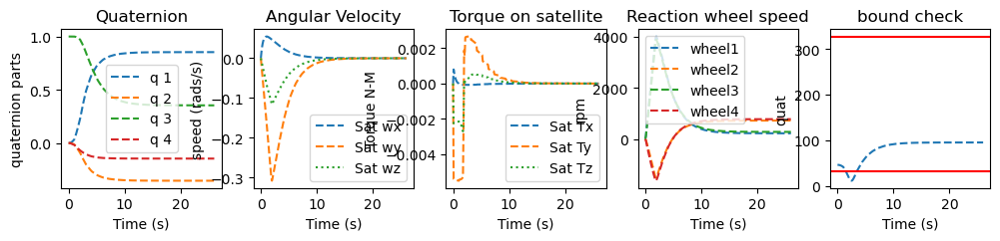

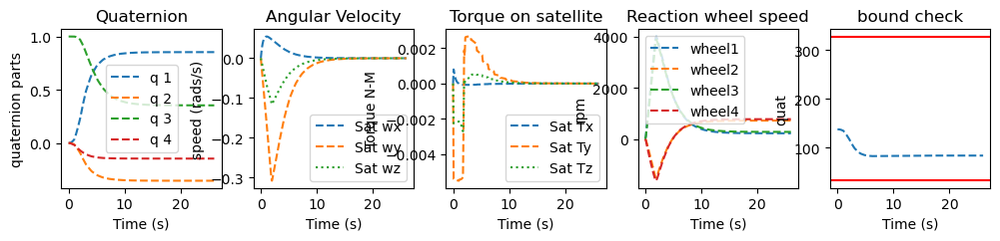

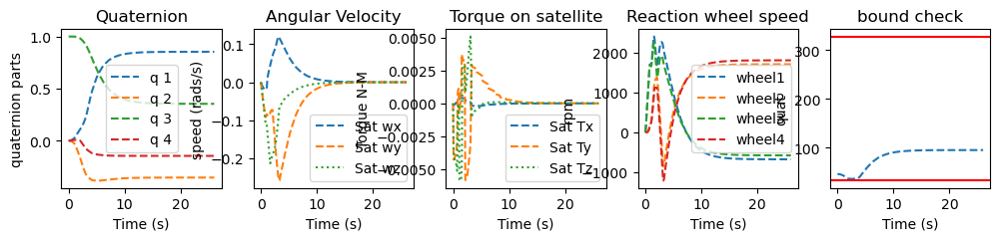

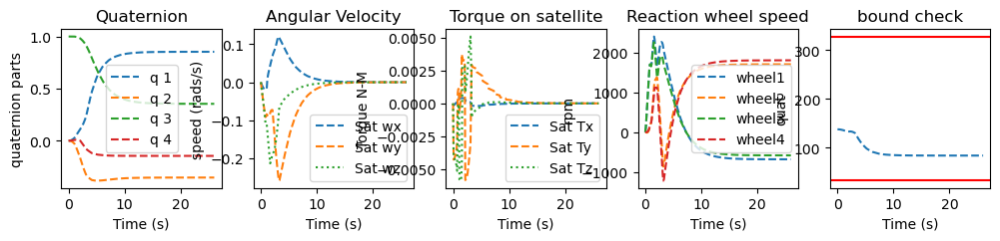

In [19]:
plotting(Time_run, linUp1, linUP2, controls1, controls2, states1, states2, dt,Bound, Sun1,Sun2, Goal_state, d, d2, State_0)

In [20]:
# 2 suns, off zero goal state
State_0 = jnp.array([.999, 0, 0.044, 0, 0, 0 ,0], dtype=jnp.float32)

old_Goal_state = jnp.array([0, 0, -1, 0, 0, 0 ,0])
Goal_state = findMinPath(old_Goal_state, State_0, 12)
Bound = .94

Time_run = 25
dt = 0.1
dt_perLinearize = 5
max_torque = .0059
kp = 2
kd = 5
d = 2*np.arccos(Bound)
d2 =2*np.arccos(Bound)

Sun1 = jnp.array([.381, -0.033, .920, -0.081], dtype=jnp.float32)
Sun2 = jnp.array([.871, 0.308, .361, 0.128], dtype=jnp.float32)
states1, states2, controls1, controls2, linUp1, linUP2 = runsimNew(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque, kp, kd)


Min Angle : 174.9563474390088
error 0:  0.043999985
0
[ 4.4001371e-02  2.6226870e-09  9.9903113e-01 -5.9546913e-08]
0.99999964
[ 4.4001374e-02  2.6227638e-09  9.9903119e-01 -5.9546888e-08]
0.9999997
[ 0.04492993 -0.00101762  0.9989885  -0.00131998]
0.99999976
[ 0.04679913 -0.00304197  0.9988936  -0.0034031 ]
0.99999976
[ 0.04961209 -0.00606301  0.9987325  -0.00589538]
0.99999976
5
[ 0.05336803 -0.0100736   0.998487   -0.00858154]
0.99999976
[ 0.06278977 -0.02003564  0.9977259  -0.01408251]
0.99999964
[ 0.07340961 -0.03040402  0.99667555 -0.01800034]
0.99999976
[ 0.08523734 -0.04121348  0.995288   -0.0209106 ]
0.9999997
[ 0.09827016 -0.05246809  0.99350643 -0.02312011]
0.9999997
10
[ 0.11250372 -0.06414001  0.99126935 -0.02476663]
0.99999964
[ 0.13464619 -0.07764505  0.98760086 -0.02203436]
0.99999964
[ 0.15763417 -0.09003513  0.9831943  -0.01932777]
0.9999997
[ 0.18115318 -0.10105544  0.97811145 -0.01639495]
0.9999997
[ 0.20479523 -0.11055961  0.9724514  -0.0131663 ]
0.99999976
15
[ 0.

c:\Users\fatho\anaconda3\lib\site-packages\cvxpy\problems\problem.py:1403: UserWarning:

Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.



60
[ 0.7712752   0.0283444   0.61160564 -0.1739801 ]
0.9999997
[ 0.77733004  0.03336398  0.60107374 -0.18263277]
0.9999997
[ 0.7839298   0.03903206  0.5893812  -0.19120607]
0.9999997
[ 0.79045784  0.04464089  0.5773059  -0.1997521 ]
0.9999997
[ 0.7965824   0.04993086  0.56538105 -0.20810314]
0.99999964
65
[ 0.80241185  0.05488007  0.5535227  -0.216184  ]
0.99999976
[ 0.8085986   0.05926014  0.5411243  -0.2232502 ]
0.99999976
[ 0.81532407  0.06410781  0.52755195 -0.22983746]
0.9999997
[ 0.82192284  0.0687658   0.51373404 -0.23620096]
0.9999997
[ 0.8281609   0.07307667  0.5000978  -0.24230355]
0.9999997
70
[ 0.8341554   0.07698797  0.48656186 -0.24802133]
0.9999997
[ 0.84075516  0.07993372  0.4726695  -0.25164348]
0.99999976
[ 0.8477254   0.08345278  0.45755723 -0.2550255 ]
0.9999997
[ 0.85430247  0.08675291  0.4426344  -0.2582933 ]
0.9999997
[ 0.8605731   0.08969751  0.4279299  -0.26123458]
0.99999964
75
[ 0.86662847  0.0922144   0.41340914 -0.26371163]
0.9999997
[ 0.87294924  0.0937619

c:\Users\fatho\anaconda3\lib\site-packages\cvxpy\problems\problem.py:1403: UserWarning:

Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.



80
[ 0.89758927  0.09887143  0.3402304  -0.26229885]
0.99999976
[ 0.90342665  0.09864102  0.3268509  -0.25934163]
0.99999964
[ 0.90930873  0.09862737  0.31281143 -0.2560833 ]
0.99999964
[ 0.9148267   0.09849077  0.29910368 -0.25283998]
0.99999964
[ 0.920066    0.09815693  0.2856999  -0.24943669]
0.99999964
85
[ 0.92507166  0.09755289  0.27263388 -0.24575604]
0.9999997
[ 0.92985386  0.09626649  0.26086882 -0.24093874]
0.9999997
[ 0.93463075  0.09480368  0.2490623  -0.23546788]
0.99999976
[ 0.9391157   0.09330895  0.23749922 -0.23010579]
0.9999997
[ 0.9433606   0.0917058   0.22621654 -0.22469114]
0.99999964
90
[ 0.9473898   0.08994686  0.21525241 -0.21915273]
0.9999997
[ 0.9511445   0.08759458  0.20596905 -0.21266752]
0.9999997
[ 0.95475584  0.0853745   0.19652079 -0.20623174]
0.99999976
[ 0.9581509   0.08315182  0.18728974 -0.19988643]
0.9999997
[ 0.9613552   0.08087431  0.17831664 -0.19354106]
0.9999997
95
[ 0.9643828   0.07850882  0.16963802 -0.18714838]
0.9999997
[ 0.9670504   0.0760

c:\Users\fatho\anaconda3\lib\site-packages\cvxpy\problems\problem.py:1403: UserWarning:

Solution may be inaccurate. Try another solver, adjusting the solver settings, or solve with verbose=True for more information.



100
[ 0.97639585  0.06556842  0.13541964 -0.15496083]
0.9999997
[ 0.9782305   0.06300329  0.13011073 -0.14888358]
0.9999997
[ 0.9799574   0.06048416  0.12489824 -0.14291579]
0.99999964
[ 0.9815819   0.05801005  0.11977962 -0.13705522]
0.99999976
[ 0.9831083   0.05558066  0.11475418 -0.13130094]
0.99999976
105
[ 0.9845409   0.05319583  0.10982048 -0.12565221]
0.99999976
[ 0.9857471   0.05109739  0.10548249 -0.12068365]
0.9999997
[ 0.98688215  0.04903833  0.10122573 -0.11580898]
0.9999997
[ 0.9879493   0.04701777  0.09704837 -0.11102542]
0.99999976
[ 0.98895156  0.04503518  0.0929495  -0.10633186]
0.9999997
110
[ 0.9898919   0.04309005  0.08892812 -0.10172708]
0.99999964
[ 0.9906828   0.04138185  0.0853963  -0.09768426]
0.99999976
[ 0.9914265   0.03970636  0.08193255 -0.09371955]
0.9999997
[ 0.99212563  0.03806294  0.07853498 -0.0898308 ]
0.9999997
[ 0.9927822   0.03645116  0.07520283 -0.08601688]
0.99999976
115
[ 0.99339783  0.0348704   0.07193487 -0.08227654]
0.9999996
[ 0.99391526  0.

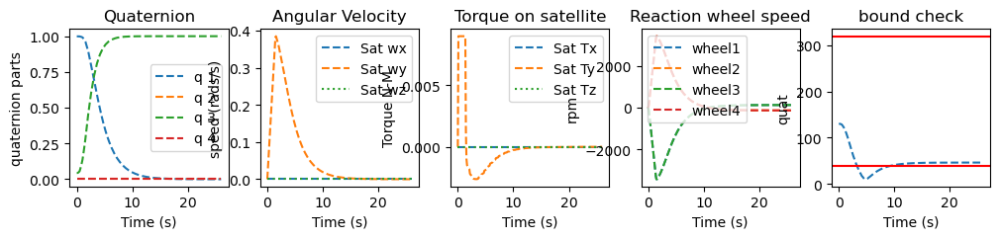

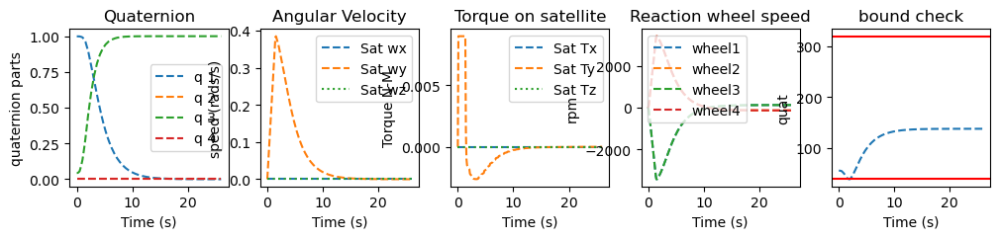

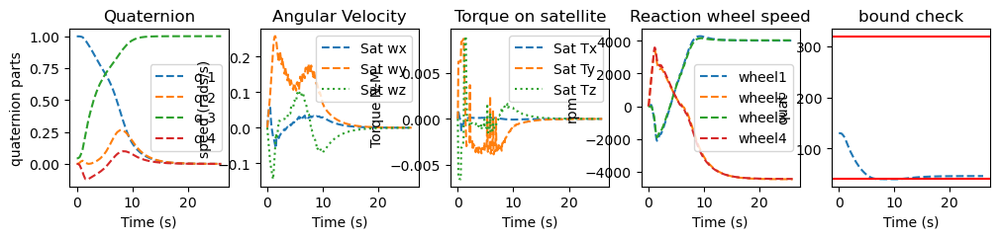

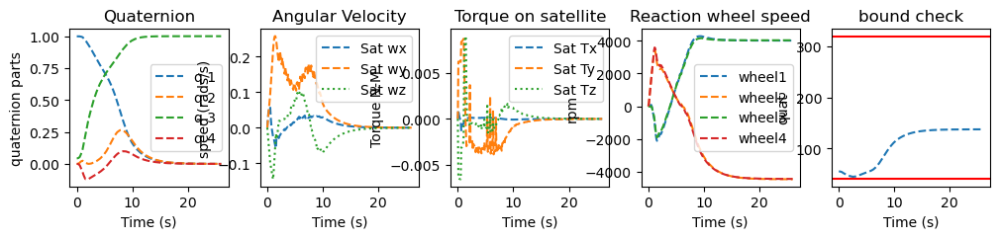

In [21]:
plotting(Time_run, linUp1, linUP2, controls1, controls2, states1, states2, dt,Bound, Sun1,Sun2, Goal_state, d, d2, State_0)

In [22]:
State_0 = state0gen2()

State_0=   [-0.42352813  0.64836055 -0.24241132 -0.58437085  0.          0.
  0.        ]
ideal goal state: [ 0  0 -1  0  0  0  0]
151.94220261556924
error 0:  0.24241132
0
[0.24241132 0.58437085 0.42352813 0.64836055]
1.0
[0.24241132 0.58437085 0.42352813 0.64836055]
1.0
[0.24440922 0.58363116 0.4250095  0.6473065 ]
1.0
[0.24827717 0.58216804 0.42776585 0.64533347]
1.0
[0.2538242 0.5800111 0.4315168 0.6426147]
1.0
[0.26080948 0.5772029  0.4359418  0.6393512 ]
0.99999994
[0.26897028 0.573794   0.44072235 0.63575095]
1.0
[0.27803406 0.5698475  0.44555175 0.63202417]
1.0
[0.28766134 0.56548184 0.4500576  0.628434  ]
0.99999994
[0.2976091  0.5607846  0.4539968  0.62516916]
1.0
10
[0.30772537 0.5558078  0.45723403 0.6223502 ]
1.0
[0.32833228 0.5455692  0.4619327  0.61738986]
0.99999994
[0.3490024  0.5343949  0.4661746  0.61261785]
1.0
[0.36961147 0.52231073 0.4698924  0.60809535]
0.99999994
[0.39007834 0.5093329  0.4730546  0.6038528 ]
1.0
[0.41034982 0.4954755  0.47564307 0.5999006 ]
1.0


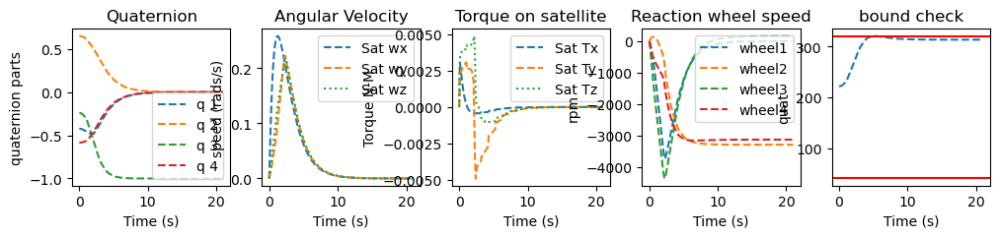

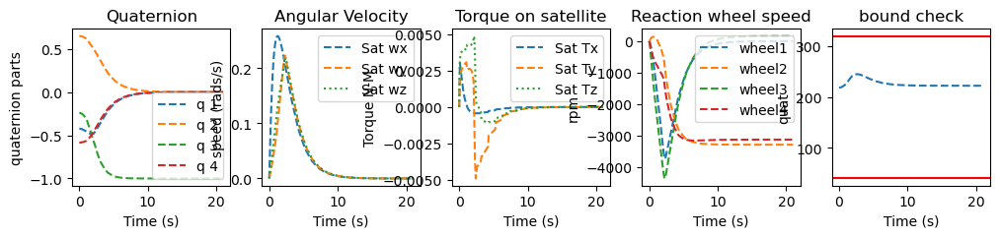

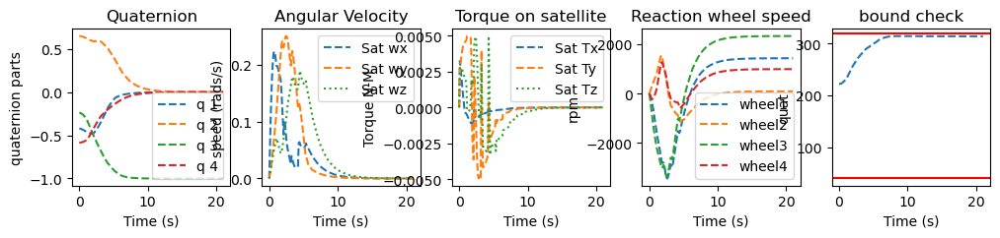

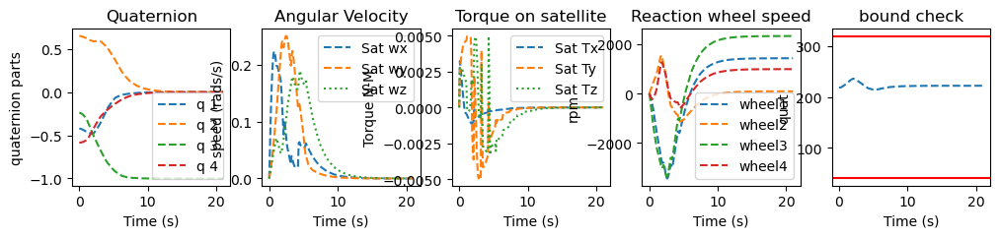

In [23]:
# 2 suns, off zero goal state

#State_0 = jnp.array([ -0.27309433, -0.6407237,  -0.51551056,  0.49914077, 0, 0 ,0])
#State_0 = jnp.array([ 0.10475697,  0.595586,   -0.7819355,   0.1512622, 0, 0 ,0])
print("State_0=  ", State_0)

old_Goal_state = jnp.array([0.854, .354, -.354, 0.146, 0, 0 ,0])
old_Goal_state = jnp.array([0, 0, -1, 0, 0, 0 ,0])
#Goal_state = jnp.array([0.707, 0, -.707, 0, 0, 0 ,0])
Goal_state = old_Goal_state
#Goal_state = jnp.array([1, 0, 0, 0, 0, 0 ,0])
#Goal_state = findMinPath(old_Goal_state, State_0, 64)
#Goal_state, State_0 = findMinTrag(Goal_state,State_0, 64)
print("ideal goal state:", Goal_state)

q = quaternion_difference(Goal_state[0:4], State_0[0:4])
print(angle(q[0]))
Bound = .94

Time_run = 20
dt = 0.1
dt_perLinearize = 10
max_torque = .005
kp = 1.2
kd = 2.5

Sun1 = jnp.array([.381, -0.033, .920, -0.081], dtype=jnp.float32)
Sun2 = jnp.array([.871, 0.308, .361, 0.128], dtype=jnp.float32)
#Sun2 = jnp.array([0, 0, 1, 0], dtype=jnp.float32)
states1, states2, controls1, controls2, linUp1, linUP2=runsimNew(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque, kp, kd)
plotting(Time_run, linUp1, linUP2, controls1, controls2, states1, states2, dt,Bound, Sun1,Sun2, Goal_state, d, d2, State_0)

In [26]:
State_0 = state0gen()

State_0=   [ 0.52722615 -0.5064635  -0.2979535   0.61380047 -0.09760437 -0.248897
 -0.00698628]
ideal goal state: [ 0.854  0.354 -0.354  0.146  0.     0.     0.   ]
124.44315067742424
error 0:  0.46605346
0
[ 0.46605346  0.44537374 -0.22341482 -0.7319742 ]
1.0006318
[ 0.4676113   0.43170574 -0.20428632 -0.7446483 ]
1.0006318
[ 0.47031325  0.41709748 -0.18652943 -0.7558478 ]
1.0006318
[ 0.47404012  0.40177885 -0.16993713 -0.76566625]
1.0006317
[ 0.47865787  0.38596836 -0.15429172 -0.77419186]
1.0006317
[ 0.48402888  0.36986592 -0.13938186 -0.7815062 ]
1.0006318
[ 0.49002212  0.35364893 -0.1250157  -0.78768367]
1.0006316
[ 0.49651965  0.33747056 -0.11102753 -0.7927917 ]
1.0006318
[ 0.5034189   0.32146084 -0.09727965 -0.7968896 ]
1.0006318
[ 0.5106337   0.30572882 -0.08366138 -0.80002993]
1.0006318
10
[ 0.518093    0.29036534 -0.07008578 -0.80225897]
1.0006317
[ 0.5329008   0.27276656 -0.06600919 -0.79907554]
1.0006317
[ 0.5477175   0.2553943  -0.06190521 -0.79511684]
1.0006317
[ 0.562515

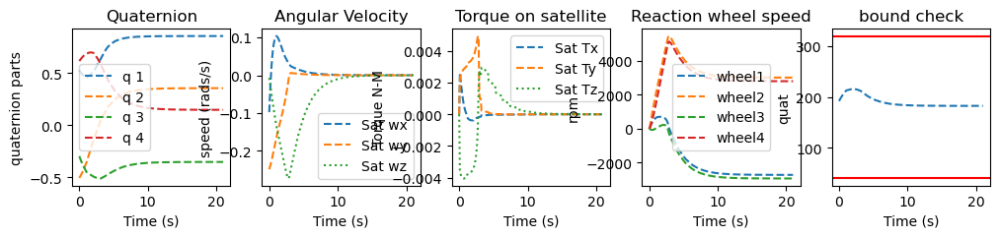

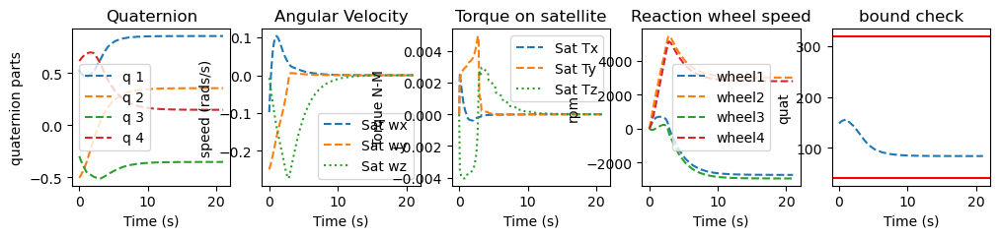

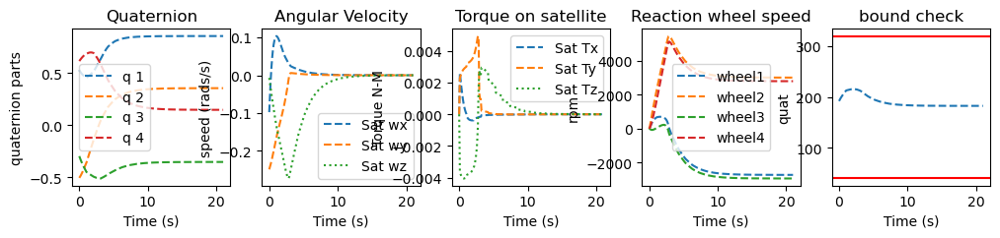

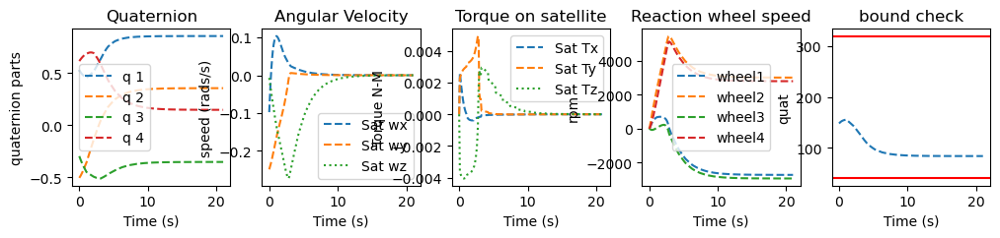

In [27]:

# 2 suns, off zero goal state

#State_0 = jnp.array([ -0.27309433, -0.6407237,  -0.51551056,  0.49914077, 0, 0 ,0])
#State_0 = jnp.array([ 0.10475697,  0.595586,   -0.7819355,   0.1512622, 0, 0 ,0])
print("State_0=  ", State_0)

old_Goal_state = jnp.array([0.854, .354, -.354, 0.146, 0, 0 ,0])
#Goal_state = jnp.array([0.707, 0, -.707, 0, 0, 0 ,0])
Goal_state = old_Goal_state
#Goal_state = jnp.array([1, 0, 0, 0, 0, 0 ,0])
#Goal_state = findMinPath(old_Goal_state, State_0, 64)
#Goal_state, State_0 = findMinTrag(Goal_state,State_0, 64)
print("ideal goal state:", Goal_state)

q = quaternion_difference(Goal_state[0:4], State_0[0:4])
print(angle(q[0]))
Bound = .94

Time_run = 20
dt = 0.1
dt_perLinearize = 10
max_torque = .005
kp = 2.2
kd = 5

Sun1 = jnp.array([.381, -0.033, .920, -0.081], dtype=jnp.float32)
Sun2 = jnp.array([.871, 0.308, .361, 0.128], dtype=jnp.float32)
#Sun2 = jnp.array([0, 0, 1, 0], dtype=jnp.float32)
states1, states2, controls1, controls2, linUp1, linUP2=runsimNew(State_0, Goal_state, Bound, Time_run, dt, dt_perLinearize, Sun1, Sun2, max_torque, kp, kd)
plotting(Time_run, linUp1, linUP2, controls1, controls2, states1, states2, dt,Bound, Sun1,Sun2, Goal_state, d, d2, State_0)